# Homework 2:

### Deadline: Thursday 28 November 2024 (by 19h00)
### Credits: 20 points

## Name/s: 

### Instructions:

- When you finish, please send me the **.ipynb** file via email to wbanda@yachaytech.edu.ec


- This homework can be submitted **individually or in pairs**. Please include your name/s in the notebook.


- Within a **single python notebook**, solve the following problem:

# Shocks in subsonic and supersonic turbulence

We want to study the properties of subsonic and supersonic turbulent flows in 2D. Shock waves are flow discontinuities that arise in turbulent gases when the local flow speed exceeds the sound speed of the gas. Let us consider the following high-resolution simulations of turbulence-in-a-box models:

### Supersonic turbulence simulation:
https://yachaytecheduec-my.sharepoint.com/:f:/g/personal/wbanda_yachaytech_edu_ec/EhXQXyn8GudCnZ15af_fLdEBcbpt7hyYpjSnwsGHrG0kDA?e=IlgN7g

### Subsonic turbulence simulation:
https://yachaytecheduec-my.sharepoint.com/:f:/g/personal/wbanda_yachaytech_edu_ec/EhNeXlEHX3JAjUYV44981LgBo9tn_BEFtUQJx98iGClHxg?e=350N8b

As explained in class, these simulations introduce stochastic force fields to generate turbulent motions in an isothermal ($\gamma=1$) gas, which is initially at rest. Turbulence is continuously generated throughout the simulations.

The simulation folders contain 101 VTK files, jointly with:

- a **units.out** file that contains the CGS normalisation values and the isothermal sound speed ($c_{\rm iso}$).

- a **vtk.out** file whose second column contains the times in code units.

Each VTK file stores the following fields:

- density (rho)

- velocity_x (vx1)

- velocity_y (vx2)

- magnetic_field_x (Bx1)

- magnetic_field_y (Bx2)

Remember that you can use VisIt to inspect the data and check if your code produces consistent outputs.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pyvista as pv
from skimage.transform import rescale
import os
import glob 
from IPython import display
from PIL import Image 
import scienceplots

In [2]:
# set the plotting style
plt.style.use(['science', 'notebook', 'no-latex'])

In [3]:
# Set the path to the subsonic and supersonic turbulence data
subsonic_data   = './TURB_DRIVE_SUB_hr/' 
supersonic_data = './TURB_DRIVE_SUP_hr/'

## 1. (3 points) Data I/O functions:

Create a set of Python functions that:

(a) reads the **units.out** file, and returns the normalisation values for length, velocity, density, magnetic field, time, and isothermal sound speed ($c_{\rm iso}$) into callable objects.

**Note:**
The normalisation values for the magnetic field ($B_0=\sqrt{4\,\pi\,\rho_0\,v_0^2}$), and time ($t_0=\frac{L_0}{v_0}$) can be derived from the length, velocity, and density values.


In [4]:
# First, let's check the structure of the units.out file
df_units = pd.read_csv(subsonic_data + 'units.out')
print(df_units)

  variable  normalisation   units
0    rho_0   1.660000e-24  g/cm^3
1      v_0   1.000000e+06    cm/s
2      L_0   3.086000e+18      cm
3    c_iso   1.000000e+06    cm/s


In [5]:
def ReadUnits(filename):
    ''' 
    Read the units.out file and return the
    normalisation units for the simulation.

    Arguments:
            - filename (str) : the path to the units.out file

    Returns:
            - L_0 (float)   : the length normalisation in cm
            - v_0 (float)   : the velocity normalisation in cm/s
            - rho_0 (float) : the density normalisation in g/cm^3
            - B_0 (float)   : the magnetic field normalisation in G
            - t_0 (float)   : the time normalisation in s
            - c_iso (float) : the isothermal sound speed normalisation in cm/s
    '''

    df_units = pd.read_csv(filename)

    # read the units and put them into a numpy array
    rho_0 = np.array(df_units.loc[df_units['variable'] == 'rho_0']['normalisation'])
    v_0   = np.array(df_units.loc[df_units['variable'] == 'v_0']['normalisation'])
    L_0   = np.array(df_units.loc[df_units['variable'] == 'L_0']['normalisation'])
    c_iso = np.array(df_units.loc[df_units['variable'] == 'c_iso']['normalisation'])

    # compute  the missing units
    B_0 = v_0 * np.sqrt(4 * np.pi * rho_0)
    t_0 = L_0 / v_0

    return L_0, v_0, rho_0, B_0, t_0, c_iso

In [6]:
# read the units
L_0, v_0, rho_0, B_0, t_0, c_iso = ReadUnits(subsonic_data + 'units.out')

In [7]:
# print the units
print("L_0 [cm]: ", L_0)
print("v_0 [cm/s]: ", v_0)
print("rho_0 [g/cm^3]: ", rho_0)
print("B_0 [G]: ", B_0)
print("t_0 [s]: ", t_0)
print("c_iso [cm/s]: ", c_iso)

L_0 [cm]:  [3.086e+18]
v_0 [cm/s]:  [1000000.]
rho_0 [g/cm^3]:  [1.66e-24]
B_0 [G]:  [4.56729408e-06]
t_0 [s]:  [3.086e+12]
c_iso [cm/s]:  [1000000.]


(b) opens any **VTK** file, reads the data arrays, and returns the 2D, CGS-normalised arrays for:

- density (rho)

- velocity_x (vx1)

- velocity_y (vx2)

- magnetic_field_x (Bx1)

- magnetic_field_y (Bx2)

**Note:**
Use the normalisation values returned by the function from part **(a)** to convert from code units to CGS units.

In [8]:
# First, let's check the structure of the vtk files
mesh = pv.read(subsonic_data + 'data.0050.vtk')

print(mesh)
print(mesh.array_names)

RectilinearGrid (0x74e34915b520)
  N Cells:      40000
  N Points:     40401
  X Bounds:     -2.000e+00, 2.000e+00
  Y Bounds:     -2.000e+00, 2.000e+00
  Z Bounds:     0.000e+00, 0.000e+00
  Dimensions:   201, 201, 1
  N Arrays:     5
['rho', 'vx1', 'vx2', 'Bx1', 'Bx2']


In [9]:
def ReadVTKData(filename):
    '''
    Read the vtk file, extract the data and 
    return reshaped 2D arrays of the data 
    in cgs units.

    Arguments:
            - filename (str) : the path to the vtk file

    Returns:
            - rho_cgs_2D (np.array) : the density data in g/cm^3
            - vx1_cgs_2D (np.array) : the x-velocity data in cm/s
            - vx2_cgs_2D (np.array) : the y-velocity data in cm/s
            - Bx1_cgs_2D (np.array) : the x-magnetic field data in G
            - Bx2_cgs_2D (np.array) : the y-magnetic field data in G
            - prs_cgs_2D (np.array) : the thermal pressure data in dyne/cm^2
    '''
    # Open the mesh
    mesh_data = pv.read(filename)

    # Get the data columns
    rho = pv.get_array(mesh_data, "rho", preference = 'cell')
    vx1 = pv.get_array(mesh_data, "vx1", preference = 'cell')
    vx2 = pv.get_array(mesh_data, "vx2", preference = 'cell')
    Bx1 = pv.get_array(mesh_data, "Bx1", preference = 'cell')
    Bx2 = pv.get_array(mesh_data, "Bx2", preference = 'cell')
    prs = pv.get_array(mesh_data, "prs", preference = 'cell')

    # Normalise the data and reshape the arrays to a 2D mesh
    rho_cgs_2D = np.array(rho.reshape(mesh_data.dimensions[0] - 1, mesh_data.dimensions[1] - 1) * rho_0)
    vx1_cgs_2D = np.array(vx1.reshape(mesh_data.dimensions[0] - 1, mesh_data.dimensions[1] - 1) * v_0)
    vx2_cgs_2D = np.array(vx2.reshape(mesh_data.dimensions[0] - 1, mesh_data.dimensions[1] - 1) * v_0)
    Bx1_cgs_2D = np.array(Bx1.reshape(mesh_data.dimensions[0] - 1, mesh_data.dimensions[1] - 1) * B_0)
    Bx2_cgs_2D = np.array(Bx2.reshape(mesh_data.dimensions[0] - 1, mesh_data.dimensions[1] - 1) * B_0)

    return rho_cgs_2D, vx1_cgs_2D, vx2_cgs_2D, Bx1_cgs_2D, Bx2_cgs_2D

In [10]:
# call the function for the subsonic vtk file 20
rho_cgs_2D_20, vx1_cgs_2D_20, vx2_cgs_2D_20, Bx1_cgs_2D_20, Bx2_cgs_2D_20 = ReadVTKData(subsonic_data + 'data.0020.vtk')

In [11]:
# Let's get the time data 
def TimeData(filename):
    ''' 
    Function to read the time data from the vtk.out file 
    and return the normalised time data in cgs units.

    Arguments:
            - filename (str) : the path to the vtk.out file
    
    Returns:
            - time_cgs (np.array) : the normalised time data in cgs units
    '''
    
    # Read the data from the file
    df = pd.read_csv(filename, sep= r'\s+', header=None)
    
    # Extract the time data
    time_data = df.iloc[:, 1]

    # Normalise the time data
    time_cgs = time_data * t_0

    return np.array(time_cgs)

In [12]:
# Get the time data
time_cgs = TimeData(subsonic_data + 'vtk.out')

(c) reads the 2D arrays returned by the function above, interpolates them into a CGS-normalised meshgrid created with the mesh information stored in the VTK files, and exports 3 figures containing maps of:

- density

- velocity vector field, scaled by its magnitude, $v=\sqrt{v_x^2+v_y^2}$.

- magnetic vector field, scaled by its magnitude: $B=\sqrt{B_x^2+B_y^2}$.

**Notes:**

- Choose different perceptually-uniform colour schemes for each of the above quantities.
  
- Since these are high-resolution models, one way to improve the visualisation of 2D vector fields is to rescale them onto a coarser grid.

In [13]:
# Create the normalised meshgrid 
X = np.linspace(mesh.bounds[0], mesh.bounds[1], (mesh.dimensions[0] - 1)) * L_0
Y = np.linspace(mesh.bounds[2], mesh.bounds[3], (mesh.dimensions[1] - 1)) * L_0 

# Generate a meshgrid
X_2D, Y_2D = np.meshgrid(X, Y)

In [14]:
# Define a function to rescale any vector field
def RescaleVectorField(x1, x2, n):
    """
    Function to resize a vector field.

    Arguments:
            - x1 (np.array) : the x-component of the vector field
            - x2 (np.array) : the y-component of the vector field
            - n (int)       : the scaling factor

    Returns:
            - x1_res (np.array)     : the resized x-component of the vector field
            - x2_res (np.array)     : the resized y-component of the vector field
            - mag_x_res (np.array)  : the resized magnitude of the vector field
    """
    # Rescale the components
    x1_res = rescale(x1, n)
    x2_res = rescale(x2, n)
    
    mag_x = np.sqrt(x1**2 + x2**2)
    
    # Rescale the magnitude
    mag_x_res = rescale(mag_x, n)
    
    return x1_res, x2_res, mag_x_res

In [15]:
# Rescale the meshgrid
X_2D_res, Y_2D_res,_ = RescaleVectorField(X_2D, Y_2D, 0.20)

In [16]:
# Let's write a function to plot each map in a separate figure
def DensityMapPlot(rho, n, sim_type = 'subsonic'):
    '''
    Function to plot the density map. 

    Arguments:
            - rho (np.array) : the density data in g/cm^3
            - n (int)        : the index of the vtk file
            - sim_type (str) : the type of simulation (subsonic or supersonic)

    Returns:
            - density map plot
    '''
    fig, ax = plt.subplots(figsize = (8, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Density field", fontsize = 20)

    z = ax.pcolor(X_2D, Y_2D, rho, cmap = "magma", vmin = 0, vmax = 0.5e-23)
    ax.set_title(rf"$\rho_{{\rm {sim_type}}}\,[t = {time_cgs[n]:.2e}\,s]$", fontsize = 20)
    ax.set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl = plt.colorbar(z)
    cl.set_label(r"g/cm$^3$")

    plt.tight_layout()
    plt.show()
    plt.close()


def VelocityFieldPlot(vx1, vx2, n, sim_type = 'subsonic'):
    '''
    Function to plot the velocity map. 

    Arguments:
            - vx1 (np.array) : the x-velocity data in cm/s
            - vx2 (np.array) : the y-velocity data in cm/s
            - n (int)        : the index of the vtk file
            - sim_type (str) : the type of simulation (subsonic or supersonic)

    Returns:
            - velocity map plot
    '''
    
    # Rescale the velocity field
    vx1_res, vx2_res, v_mag_res = RescaleVectorField(vx1, vx2, .20)


    fig, ax = plt.subplots(figsize = (8, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Velocity vector field", fontsize = 20)

    z = ax.quiver(X_2D_res, Y_2D_res,  vx1_res, vx2_res, v_mag_res, cmap = "viridis")
    ax.set_title(rf"$\vec{{v}}_{{\rm {sim_type}}}\,[t = {time_cgs[n]:.2e}\,s]$", fontsize = 20)
    ax.set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl = plt.colorbar(z)
    cl.set_label(r"cm/s")

    plt.tight_layout()
    plt.show()
    plt.close()

    # Magnetic field map
def MagneticFieldPlot(Bx1, Bx2, n, sim_type = 'subsonic'):
    '''
    Function to plot the magnetic field map.

    Arguments:
            - Bx1 (np.array) : the x-magnetic field data in G
            - Bx2 (np.array) : the y-magnetic field data in G
            - n (int)        : the index of the vtk file
            - sim_type (str) : the type of simulation (subsonic or supersonic)


    Returns:
            - magnetic field map plot
    '''
    # Rescale the velocity field
    Bx1_res, Bx2_res, B_mag_res = RescaleVectorField(Bx1, Bx2, .20)

    fig, ax = plt.subplots(figsize = (8, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Magnetic vector field", fontsize = 20)

    z = ax.quiver(X_2D_res, Y_2D_res,  Bx1_res, Bx2_res, B_mag_res, cmap = "magma")
    ax.set_title(rf"$\vec{{B}}_{{\rm {sim_type}}}\,[t = {time_cgs[n]:.2e}\,s]$", fontsize = 20)
    ax.set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl = plt.colorbar(z)
    cl.set_label(r"G")

    plt.tight_layout()
    plt.show()
    plt.close()

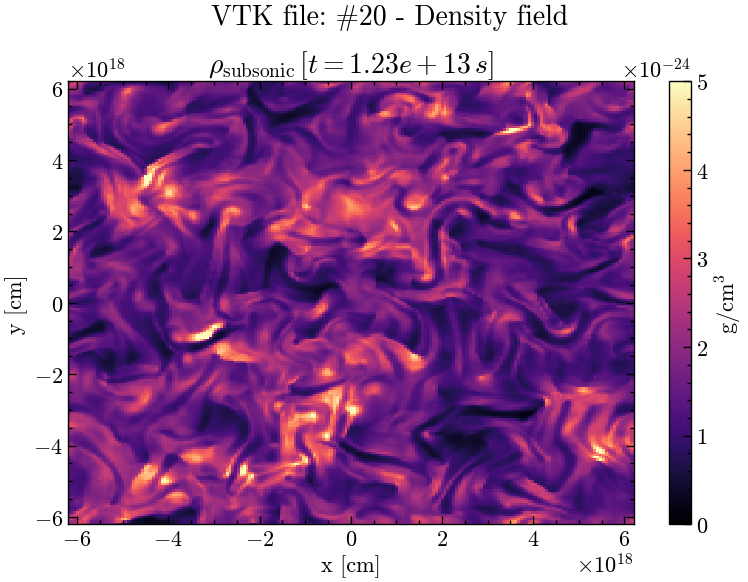

In [17]:
# Call the functions to plot the maps using the data of the 50th vtk file
DensityMapPlot(rho_cgs_2D_20, 20, 'subsonic')

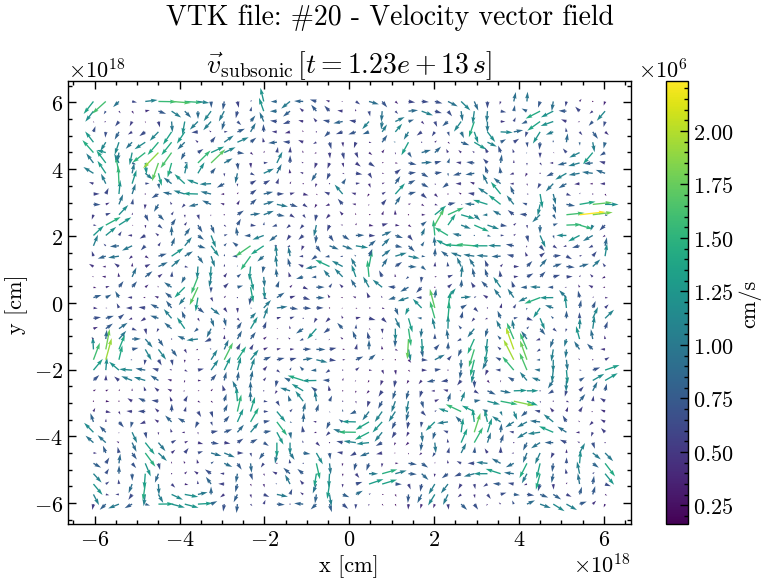

In [18]:
VelocityFieldPlot(vx1_cgs_2D_20, vx2_cgs_2D_20, 20, 'subsonic')

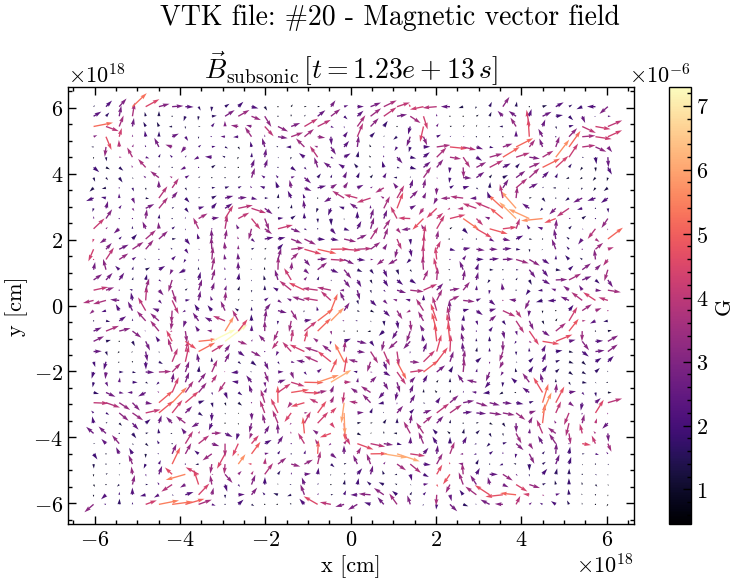

In [19]:
MagneticFieldPlot(Bx1_cgs_2D_20, Bx2_cgs_2D_20, 20, 'subsonic')

## 2. (4 points) Data visualisation and density comparison:

Use python to carry out the following analysis:

(d) Call the above functions for VTK file # 50 of each simulation, and make the following maps using the correct mesh coordinates and dimensions:

- A 2-panel figure showing the supersonic (left) and subsonic (right) density, $\rho$.

- A 2-panel figure showing the supersonic (left) and subsonic (right) velocity vector field, $\vec{v}$.

- A 2-panel figure showing the supersonic (left) and subsonic (right) magnetic vector field, $\vec{B}$.

In [20]:
# First, let's create the functions to generate the two-panel plots asked in the question
def twoPanelDensity(rho_sup, rho_sub, n):
    '''
    Function to generate a 2-panel plot of the density maps for the subsonic and supersonic simulations.

    Arguments:
            - rho1 (np.array) : the density data in g/cm^3 for the supersonic simulation
            - rho2 (np.array) : the density data in g/cm^3 for the subsonic simulation
            - n (int)         : the index of the vtk file

    Returns:
            - save the map as a .png file
    '''
    fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Density field", fontsize = 20)

    z1 = ax[0].pcolor(X_2D, Y_2D, rho_sup, cmap = "magma", vmin = 0, vmax = 0.5e-23)
    ax[0].set_title(r"$\rho_{\rm supersonic}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[0].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl1 = plt.colorbar(z1, ax = ax[0])
    cl1.set_label(r"g/cm$^3$")

    z2 = ax[1].pcolor(X_2D, Y_2D, rho_sub, cmap = "magma", vmin = 0, vmax = 0.5e-23)
    ax[1].set_title(r"$\rho_{\rm subsonic}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[1].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl2 = plt.colorbar(z2, ax = ax[1])
    cl2.set_label(r"g/cm$^3$")

    plt.tight_layout()
    plt.show()
    plt.close()

def twoPanelVelocity(vx1_sup, vx2_sup, vx1_sub, vx2_sub, n):
    '''
    Function to generate a 2-panel plot of the velocity maps for the subsonic and supersonic simulations.

    Arguments:
            - vx1_1 (np.array) : the x-velocity data in cm/s for the subsonic simulation
            - vx2_1 (np.array) : the y-velocity data in cm/s for the subsonic simulation
            - vx1_2 (np.array) : the x-velocity data in cm/s for the supersonic simulation
            - vx2_2 (np.array) : the y-velocity data in cm/s for the supersonic simulation
            - n (int)        : the index of the vtk file
    Returns:
            - save the map as a .png file
    '''
    # Rescale the velocity field
    vx1_res_sup, vx2_res_sup, v_mag_res_sup = RescaleVectorField(vx1_sup, vx2_sup, .20)
    vx1_res_sub, vx2_res_sub, v_mag_res_sub = RescaleVectorField(vx1_sub, vx2_sub, .20)

    fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Velocity vector field", fontsize = 20)

    z1 = ax[0].quiver(X_2D_res, Y_2D_res,  vx1_res_sup, vx2_res_sup, v_mag_res_sup, cmap = "viridis")
    ax[0].set_title(r"$\vec{v}_{\rm supersonic}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[0].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl1 = plt.colorbar(z1, ax = ax[0])
    cl1.set_label(r"cm/s")

    z2 = ax[1].quiver(X_2D_res, Y_2D_res,  vx1_res_sub, vx2_res_sub, v_mag_res_sub, cmap = "viridis")
    ax[1].set_title(r"$\vec{v}_{\rm subsonic}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[1].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl2 = plt.colorbar(z2, ax = ax[1])
    cl2.set_label(r"cm/s")

    plt.tight_layout()
    plt.show()
    plt.close()


def twoPanelMagneticField(Bx1_sup, Bx2_sup, Bx1_sub, Bx2_sub, n):
    '''
    Function to generate a 2-panel plot of the magnetic field maps for the subsonic and supersonic simulations.

    Arguments:
            - Bx1_1 (np.array) : the x-magnetic field data in G for the subsonic simulation
            - Bx2_1 (np.array) : the y-magnetic field data in G for the subsonic simulation
            - Bx1_2 (np.array) : the x-magnetic field data in G for the supersonic simulation
            - Bx2_2 (np.array) : the y-magnetic field data in G for the supersonic simulation
            - n (int)        : the index of the vtk file

    Returns:
            - save the map as a .png file
    '''
    # Rescale the velocity field
    Bx1_res_sup, Bx2_res_sup, B_mag_res_sup = RescaleVectorField(Bx1_sup, Bx2_sup, .20)
    Bx1_res_sub, Bx2_res_sub, B_mag_res_sub = RescaleVectorField(Bx1_sub, Bx2_sub, .20)

    fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Magnetic vector field", fontsize = 20)

    z1 = ax[0].quiver(X_2D_res, Y_2D_res,  Bx1_res_sup, Bx2_res_sup, B_mag_res_sup, cmap = "magma")
    ax[0].set_title(r"$\vec{B}_{\rm supersonic}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[0].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl1 = plt.colorbar(z1, ax = ax[0])
    cl1.set_label(r"G")

    z2 = ax[1].quiver(X_2D_res, Y_2D_res,  Bx1_res_sub, Bx2_res_sub, B_mag_res_sub, cmap = "magma")
    ax[1].set_title(r"$\vec{B}_{\rm subsonic}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[1].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl2 = plt.colorbar(z2, ax = ax[1])
    cl2.set_label(r"G")

    plt.tight_layout()
    plt.show()
    plt.close()

In [21]:
# Read the #50 vtk file for the supersonic and subsonic simulations
rho_cgs_2D_50_sub, vx1_cgs_2D_50_sub, vx2_cgs_2D_50_sub, Bx1_cgs_2D_50_sub, Bx2_cgs_2D_50_sub = ReadVTKData(subsonic_data + 'data.0050.vtk')
rho_cgs_2D_50_sup, vx1_cgs_2D_50_sup, vx2_cgs_2D_50_sup, Bx1_cgs_2D_50_sup, Bx2_cgs_2D_50_sup = ReadVTKData(supersonic_data + 'data.0050.vtk')

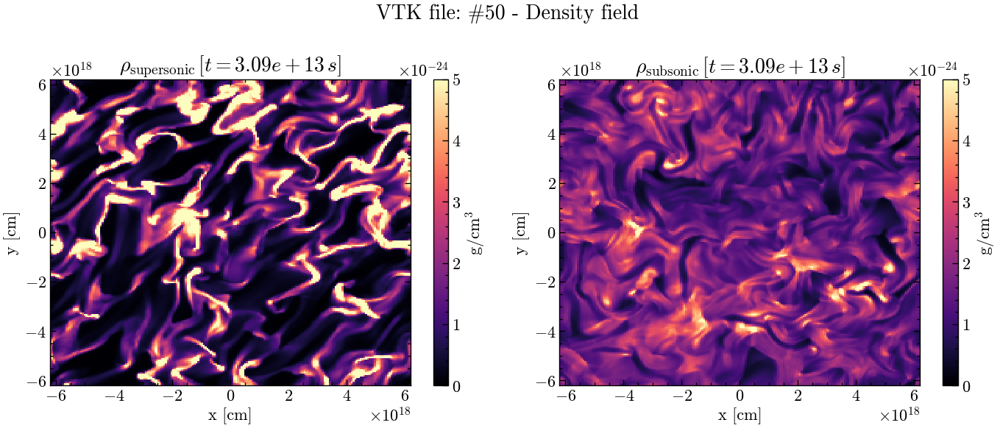

In [22]:
# Generate the two-panel plots for the density
twoPanelDensity(rho_cgs_2D_50_sup, rho_cgs_2D_50_sub, 50)

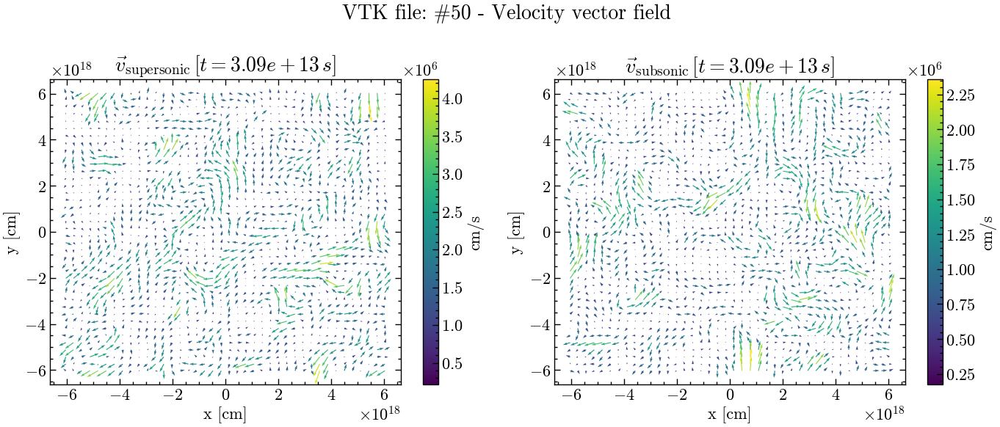

In [23]:
# Generate the two-panel plots for the velocity field
twoPanelVelocity(vx1_cgs_2D_50_sup, vx2_cgs_2D_50_sup, vx1_cgs_2D_50_sub, vx2_cgs_2D_50_sub, 50)

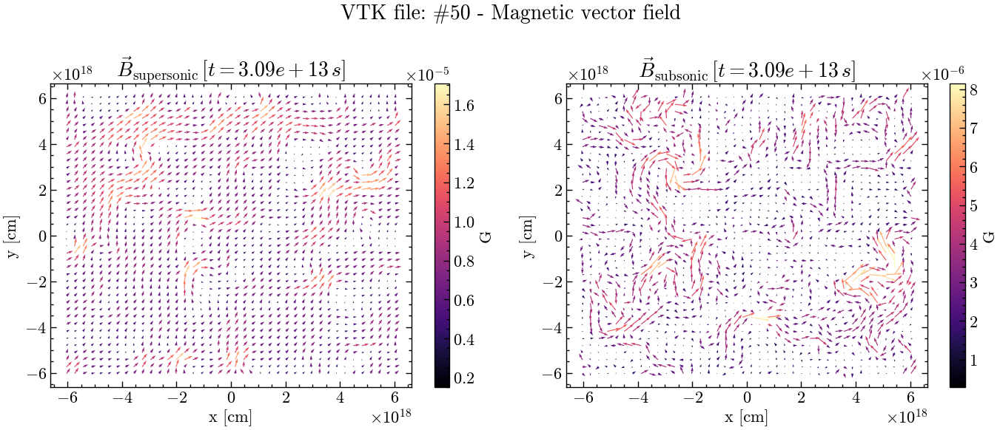

In [24]:
# Generate the two-panel plots for the magnetic field
twoPanelMagneticField(Bx1_cgs_2D_50_sup, Bx2_cgs_2D_50_sup, Bx1_cgs_2D_50_sub, Bx2_cgs_2D_50_sub, 50)


(e) Compute 1D histograms of the density and the velocity magnitude, and make the following figures:

- A 2-panel figure showing the supersonic (left) and subsonic (right) 1D histograms of the density.

- A 2-panel figure showing the supersonic (left) and subsonic (right) 1D histograms of the velocity magnitude.

In [25]:
# Now, let's write the functions to plot the histograms
def twoPaneDensityHist(rho_sup, rho_sub, n):
    '''
    Function to generate a 2-panel plot of the density histograms for the subsonic and supersonic simulations.

    Arguments:
            - rho1 (np.array) : the density data in g/cm^3 for the subsonic simulation
            - rho2 (np.array) : the density data in g/cm^3 for the supersonic simulation
            - time (float)    : the time in cgs units

    Returns:
            - plot the histograms
    '''
    # Flatten the density data
    rho_sup_flat = rho_sup.flatten()
    rho_sub_flat = rho_sub.flatten()

    fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Histogram of the density", fontsize = 20)

    ax[0].hist(rho_sup_flat, bins = 100, color = "blue", alpha = 0.7)
    ax[0].set_title(r"$\rho_{\rm sup}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[0].set(xlabel = r"g/cm$^3$", ylabel = "Frequency")

    ax[1].hist(rho_sub_flat, bins = 100, color = "red", alpha = 0.7)
    ax[1].set_title(r"$\rho_{\rm sub}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[1].set(xlabel = r"g/cm$^3$", ylabel = "Frequency")

    plt.tight_layout()
    plt.show()
    plt.close()

def twoPaneVelocityHist(vx1_sup, vx2_sup, vx1_sub, vx2_sub, n):
    '''
    Function to generate a 2-panel plot of the velocity histograms for the subsonic and supersonic simulations.

    Arguments:
            - vx1_1 (np.array) : the x-velocity data in cm/s for the subsonic simulation
            - vx1_2 (np.array) : the x-velocity data in cm/s for the supersonic simulation
            - time (float)     : the time in cgs units

    Returns:
            - plot the histograms
    '''
    # Flatten the velocity data
    v_sup_flat = np.sqrt(vx1_sup**2 + vx2_sup**2).flatten()
    v_sub_flat = np.sqrt(vx1_sub**2 + vx2_sub**2).flatten()

    fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    fig.suptitle("VTK file: #" + f"{n}" + " - Histogram of the velocity magnitude", fontsize = 20)

    ax[0].hist(v_sup_flat, bins = 100, color = "blue", alpha = 0.7)
    ax[0].set_title(r"$v_{\rm sup}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[0].set(xlabel = r"cm/s", ylabel = "Frequency")

    ax[1].hist(v_sub_flat, bins = 100, color = "red", alpha = 0.7)
    ax[1].set_title(r"$v_{\rm sub}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[1].set(xlabel = r"cm/s", ylabel = "Frequency")


    plt.tight_layout()
    plt.show()
    plt.close()

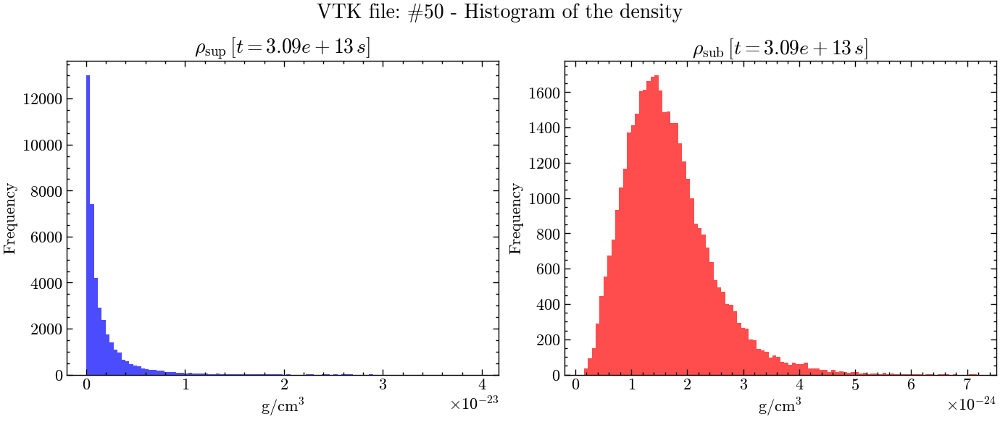

In [26]:
# Generate the two-panel plots for the density histograms
twoPaneDensityHist(rho_cgs_2D_50_sup, rho_cgs_2D_50_sub, 50)

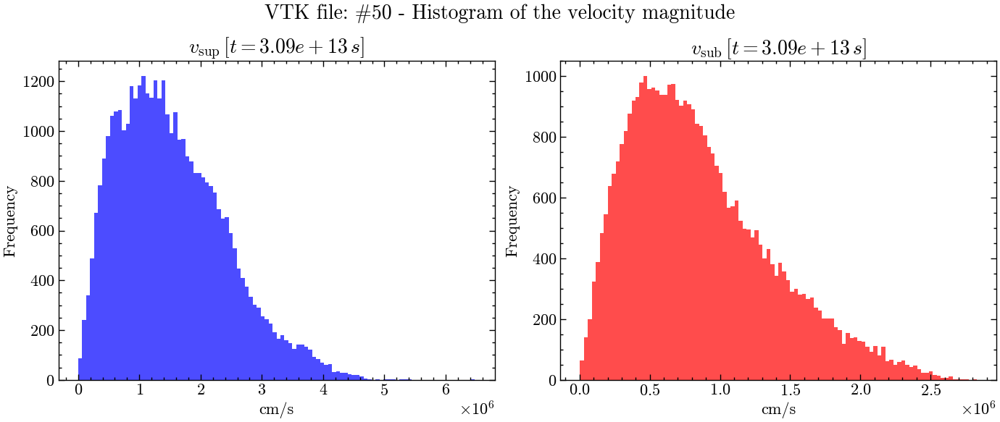

In [27]:
# Generate the two-panel plots for the velocity histograms
twoPaneVelocityHist(vx1_cgs_2D_50_sup, vx2_cgs_2D_50_sup, vx1_cgs_2D_50_sub, vx2_cgs_2D_50_sub, 50)

(f) What distributions do the density and velocity fields have? Do you see differences between the supersonic and subsonic distributions? Why?

The density and velocity magnitude distributions are expected to be log-normal. On the one hand, we have that the density field has a broader distrubution in the subsonic case, with a peak about $1.5E-24$ [g/cm$^3$], while the supersonic case has a narrower distribution with a peak about $0.1E-23$ [g/cm$^3$]. On the other hand, in the subsonic regime, the velocity magnitude distribution is almost half narrower than in the supersonic regime, with a peak about $0.5E+6$ [cm/s] for the subsonic case, and $1.2E+6$ [cm/s] for the supersonic case.

The differences between the supersonic and subsonic distributions are due to the presence of shocks and turbulence that create a broad range of velocities and a an overall low density region. On the other hand, smoother flow dynamics in the subsonic regime lead to narow velocity distributions and a more symmetric density distribution.


## 3. (6 points) Numerical differentiation and shock candidates:

Create a set of Python functions that:

(g) Isolate candidate shocked cells in binary fields, based on the following methods:

- **Method 1:** Read a 2D velocity vector field. Compute the divergence of the velocity field and isolate the cells where there are convergent flows (i.e. where $\vec\nabla\cdot \vec v <\alpha$, where $\alpha=0$). Cells with convergent flows are candidate shocked cells. Try with $\alpha$ values slightly lower than $0$ for better results.

I will carry out all the analysis in code units, therefore the exported maps and vtk files will be in code units. 

In [28]:
# Write the function for the first method
def IsolateNegativeDiv(vx1, vx2, n, show = False):
    """ 
    Function to compute the divergence of the velocity vector field and 
    isolate the cells with converging flows.

    Arguments:
            - vx1 (np.array) : the x-velocity data in cm/s
            - vx2 (np.array) : the y-velocity data in cm/s
            - n (int)        : vtk file number
            - show (bool)    : whether to show the map or not

    Returns:
            - div (np.array)    : the divergence of the velocity field
            - div_neg (np.array): the cells with negative
            - Optional          : plot the divergence map
    """
    # Velocity components in code units
    vx1_code = vx1 /  v_0
    vx2_code = vx2 /  v_0

    # Compute the divergence
    div = np.gradient(vx1_code, axis = 1) + np.gradient(vx2_code, axis = 0)

    alpha = -0.002

    # Isolate the cells with negative divergence
    div_neg = np.where(div < alpha, div, np.nan)

    # Optional: plot the divergence map
    if show:
        fig, ax = plt.subplots(1, 2, figsize = (14, 6))
        fig.suptitle(f"VTK file: #{n}" + " - Divergence of the velocity field", fontsize = 20)

        z0 = ax[0].pcolormesh(X_2D, Y_2D, div, cmap = "magma")
        ax[0].set_title(r"$\vec \nabla\cdot\vec{v}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
        ax[0].set(xlabel = "x [cm]", ylabel = "y [cm]")
        cl0 = plt.colorbar(z0)
        cl0.set_label(r"$\vec\nabla\cdot \vec v$")

        z1 = ax[1].pcolormesh(X_2D, Y_2D, div_neg, cmap = "magma")
        ax[1].set_title(r"$\vec \nabla\cdot\vec{v}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
        ax[1].set(xlabel = "x [cm]", ylabel = "y [cm]")
        cl1 = plt.colorbar(z1)
        cl1.set_label(rf" $\vec\nabla\cdot \vec v < {alpha}$")

        plt.tight_layout()
        plt.show()
        plt.close()
    
    return div, div_neg

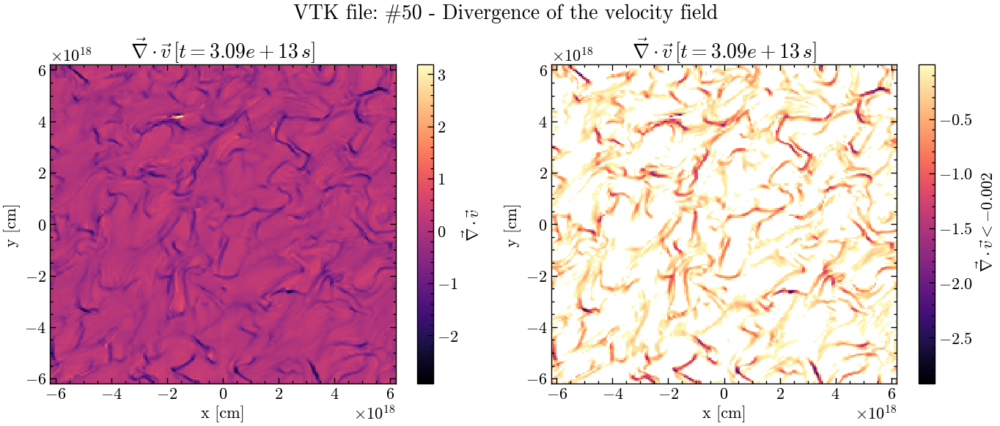

In [29]:
# Call the function for the subsonic simulation
div_50_sup, div_neg_50_sup = IsolateNegativeDiv(vx1_cgs_2D_50_sup, vx2_cgs_2D_50_sup, 50, show = True)

- **Method 2:** Calculate the 2D pressure field using the equation of state of isothermal gas, i.e. $p=\rho\,c_{\rm iso}^2$. Compute the gradient of the pressure and isolate the cells with large pressure gradients (i.e. where $\frac{|\vec\nabla P|}{P}>0.01\max{\left(\frac{|\vec\nabla P|}{P}\right)}$). Such cells are candidate shocked cells.

In [30]:
# Define the function for the second method
def IsolateLargeGrad(rho, n, show = False):
    '''
    Function to compute the gradient of the density field and isolate the cells with large gradients.

    Arguments:
            - rho (np.array) : the density data in g/cm^3
            - n (int)        : vtk file number
            - show (bool)    : whether to show the map or not

    Returns:
            - grad_rho (np.array)      : the gradient of the density field
            - grad_rho_large (np.array): the cells with large gradients
            - Optional                 : plot the gradient map
    '''
    # Compute the 2D pressure field
    prs_2D = np.array(rho * c_iso**2)

    # Get the prs field in code units
    prs_code = prs_2D /(v_0**2 * rho_0)

    # Compute the gradient of the pressure field
    grad_prs = np.gradient(prs_code, axis = 1) + np.gradient(prs_code, axis = 0)

    # Define the ratio 
    ratio = np.abs(grad_prs) / prs_2D


    # Now, isolate the cells with large gradients
    large_grad_prs = np.where(ratio > 0.013 * np.max(ratio), abs(grad_prs), np.nan)


    # Optional: plot the gradient map
    if show:
        fig, ax = plt.subplots(1, 2, figsize = (14, 6))
        fig.suptitle(f"VTK file: #{n}" + " - Gradient of the presure field", fontsize = 20)

        z0 = ax[0].pcolormesh(X_2D, Y_2D, grad_prs, cmap = "magma_r")
        ax[0].set_title(r"$\vec \nabla P\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
        ax[0].set(xlabel = "x [cm]", ylabel = "y [cm]")
        cl0 = plt.colorbar(z0)
        cl0.set_label(r"$|\vec\nabla P|$")

        z1 = ax[1].pcolormesh(X_2D, Y_2D, large_grad_prs, cmap = "magma_r")
        ax[1].set_title(r"$\vec \nabla P\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
        ax[1].set(xlabel = "x [cm]", ylabel = "y [cm]")
        cl1 = plt.colorbar(z1)
        cl1.set_label(r"$\frac{|\vec\nabla P|}{P}>0.01\max{\left(\frac{|\vec\nabla P|}{P}\right)}$")

        plt.tight_layout()
        plt.show()
        plt.close()

    return grad_prs, large_grad_prs

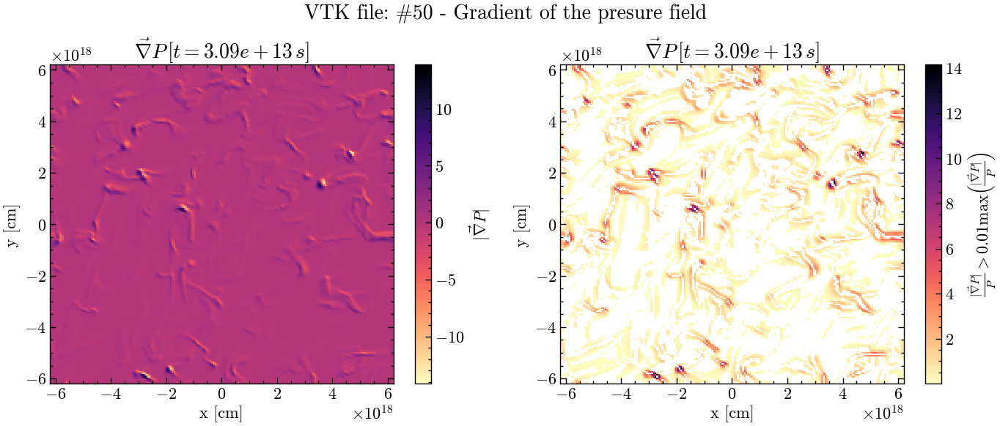

In [31]:
# Call the function for the subsonic simulation
grad_50_sup, grad_large_50_sup = IsolateLargeGrad(rho_cgs_2D_50_sup, 50, show = True)

(h) Call your shock-finding function/s from (g) for VTK file # 50 of each simulation, and make binary maps of the resulting candidate shock cells from both methods and for both models. Show the results as follows:

- A 2-panel figure showing the supersonic (left) and subsonic (right) shocked cell candidates, computed from method 1.

- A 2-panel figure showing the supersonic (left) and subsonic (right) shocked cell candidates, computed from method 2.

In [32]:
# Define a function to generate 2-panel plot showing 
# binary maps of the two methods
def binaryShockCellsMaps(negative_div, large_grad, n, sim_type = "subsonic"):
    '''
    Function to generate a 2-panel plot of the binary maps for the two methods.

    Arguments:
            - negative_div (np.array) : the isolated cells with negative divergence
            - large_grad (np.array)    : the isolated cells with large gradients
            - n (int)                 : vtk file number
            - sim_type (str)          : the type of simulation (subsonic or supersonic)

    Returns:
            - show the binary maps
    '''
    # Define the binary maps
    binary_div = np.where(~np.isnan(negative_div), 1, 0)
    binary_grad = np.where(~np.isnan(large_grad), 1, 0)

    print(np.sum(binary_div), np.sum(binary_grad))

    fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    fig.suptitle(f"VTK file: #{n} " + sim_type + " - Binary maps for the shock cell candidates", fontsize = 20)

    z0 = ax[0].pcolormesh(X_2D, Y_2D, binary_div, cmap = "magma_r")
    ax[0].set_title(r"Negative divergenc of $\vec{v}$", fontsize = 20)
    ax[0].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl0 = plt.colorbar(z0)
    #cl0.set_label(r"$|\nabla\cdot\vec{v}|$")

    z1 = ax[1].pcolormesh(X_2D, Y_2D, binary_grad, cmap = "magma_r")
    ax[1].set_title(r"Large gradient of P", fontsize = 20)
    ax[1].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl1 = plt.colorbar(z1)
    #cl1.set_label(r"$|\nabla\rho|$")

    plt.tight_layout()
    plt.show()
    plt.close()

14963 14523


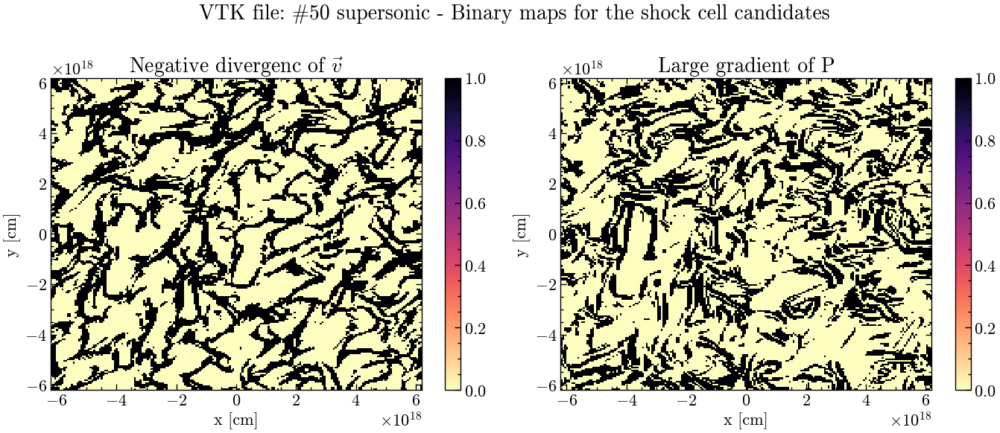

In [33]:
# Call the function for the subsonic simulation vtk file 50
binaryShockCellsMaps(div_neg_50_sup, grad_large_50_sup, 50, "supersonic")

(i) Compute 1D histograms of the shock cell candidates from both methods and for both models, and make the following figures:

- A 2-panel figure showing the supersonic (left) and subsonic (right) shocked cell candidates, computed from method 1.

- A 2-panel figure showing the supersonic (left) and subsonic (right) shocked cell candidates, computed from method 2.

In [34]:
# We will use the binary data to generate the histograms
# Now, let's write the functions to plot the histograms
def ShockCellsHistM1(vx1_sup, vx2_sup, vx1_sub, vx2_sub, n):
    '''
    This function generates a histogram of the shock cell candidates for the 
    subsonic and supersonic simulations using the method of the negative divergence.

    Arguments:
            - vx1_sup (np.array) : the x-velocity data in cm/s for the supersonic simulation
            - vx2_sup (np.array) : the y-velocity data in cm/s for the supersonic simulation
            - vx1_sub (np.array) : the x-velocity data in cm/s for the subsonic simulation
            - vx2_sub (np.array) : the y-velocity data in cm/s for the subsonic simulation
            - n (int)           : the index of the vtk file
    
    Returns:
            - show the histogram
    '''

    
    # Compute the shock cells candidates
    _, div_sup_neg = IsolateNegativeDiv(vx1_sup, vx2_sup, n)
    _, div_sub_neg = IsolateNegativeDiv(vx1_sub, vx2_sub, n)
 
    # Get the binary maps
    #binary_div_sup = np.where(div_sup_neg < -0.2, 1, 0)
    #binary_div_sub = np.where(div_sub_neg < -0.2, 1, 0)


    # Flatten the binary maps
    binary_div_flat_sup =  abs(div_sup_neg.flatten()) #binary_div_sup.flatten()
    binary_div_flat_sub =  abs(div_sub_neg.flatten()) #binary_div_sub.flatten()

    n_cells_sup = np.count_nonzero(~np.isnan(binary_div_flat_sup))
    n_cells_sub = np.count_nonzero(~np.isnan(binary_div_flat_sub))


    fig, ax = plt.subplots(1, 2, figsize = (14, 6))

    fig.suptitle(f"VTK file #{n}" + f" : Shock cell candidates - Method 1", fontsize = 20)

    ax[0].hist(binary_div_flat_sup, bins = 10, color = "blue", alpha = 0.7)
    ax[0].set_title(r"$\vec \nabla\cdot \vec{v}_{\rm {sup}}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[0].set(xlabel = r"$|\vec{\nabla}\cdot \vec{v}|$", ylabel = "Frequency")
    ax[0].legend([f"# shock cells: {n_cells_sup}"])

    ax[1].hist(binary_div_flat_sub, bins = 10, color = "red", alpha = 0.7)
    ax[1].set_title(r"$\vec \nabla \cdot \vec{v}_{\rm {sub}}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[1].set(xlabel =r"$|\vec{\nabla}\cdot \vec{v}|$", ylabel = "Frequency")
    ax[1].legend([f"# shock cells: {n_cells_sub}"])

    plt.tight_layout()
    plt.show()
    plt.close()

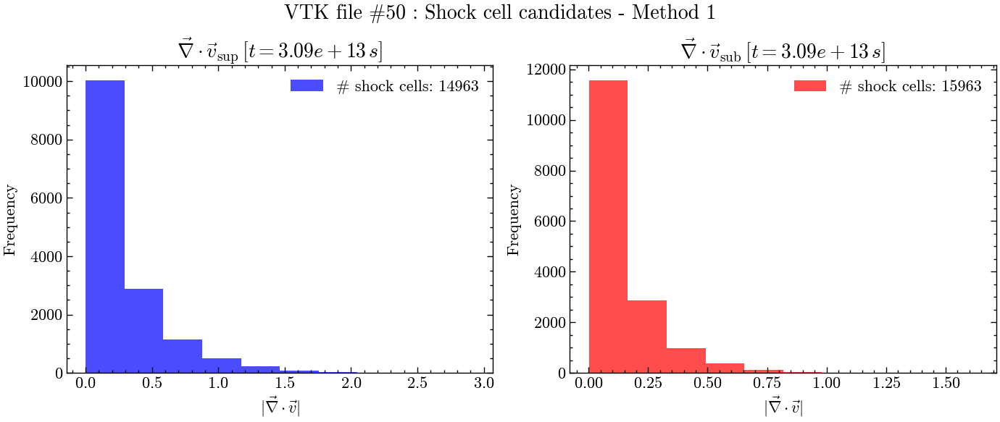

In [35]:
# Call the function for the method 1
ShockCellsHistM1(vx1_cgs_2D_50_sup, vx2_cgs_2D_50_sup, vx1_cgs_2D_50_sub, vx2_cgs_2D_50_sub, 50)

In [36]:
def ShockCellsHistM2(rho_sup, rho_sub, n):
        '''
        This function generates a histogram of the shock cell candidates for the
        subsonic and supersonic simulations using the method of the large gradients.

        Arguments:
                - rho_sup (np.array) : the density data in g/cm^3 for the supersonic simulation
                - rho_sub (np.array) : the density data in g/cm^3 for the subsonic simulation
                - n (int)           : the index of the vtk file

        Returns:
                - show the histogram
        '''

        
        # Compute the shock cells candidates
        _, grad_sup_large = IsolateLargeGrad(rho_sup, n)
        _, grad_sub_large = IsolateLargeGrad(rho_sub, n)
    
        # Get the binary maps
        #binary_grad_sup = np.where(grad_sup_large > 0.03e-11, 1, 0)
        #binary_grad_sub = np.where(grad_sub_large > 0.03e-11, 1, 0)
    
    
        # Flatten the binary maps
        binary_grad_flat_sup = grad_sup_large.flatten() #binary_grad_sup.flatten()
        binary_grad_flat_sub = grad_sub_large.flatten() #binary_grad_sub.flatten()

        n_cells_sup = np.count_nonzero(~np.isnan(binary_grad_flat_sup))
        n_cells_sub = np.count_nonzero(~np.isnan(binary_grad_flat_sub))
    
    
        fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    
        fig.suptitle(f"VTK file #{n}" + f" : Shock cell candidates - Method 2", fontsize = 20)
    
        ax[0].hist(binary_grad_flat_sup, bins = 10, color = "blue", alpha = 0.7)
        ax[0].set_title(r"$\vec \nabla P_{\rm {sup}}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
        ax[0].set(xlabel = r"$|\vec{\nabla}P|$", ylabel = "Frequency")
        ax[0].legend([f"# shock cells: {n_cells_sup}"])
    
        ax[1].hist(binary_grad_flat_sub, bins = 10, color = "red", alpha = 0.7)
        ax[1].set_title(r"$\vec \nabla P_{\rm {sub}}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
        ax[1].set(xlabel = r"$|\vec{\nabla}P|$", ylabel = "Frequency")
        ax[1].legend([f"# shock cells: {n_cells_sub}"])
    

        plt.tight_layout()
        plt.show()
        plt.close()

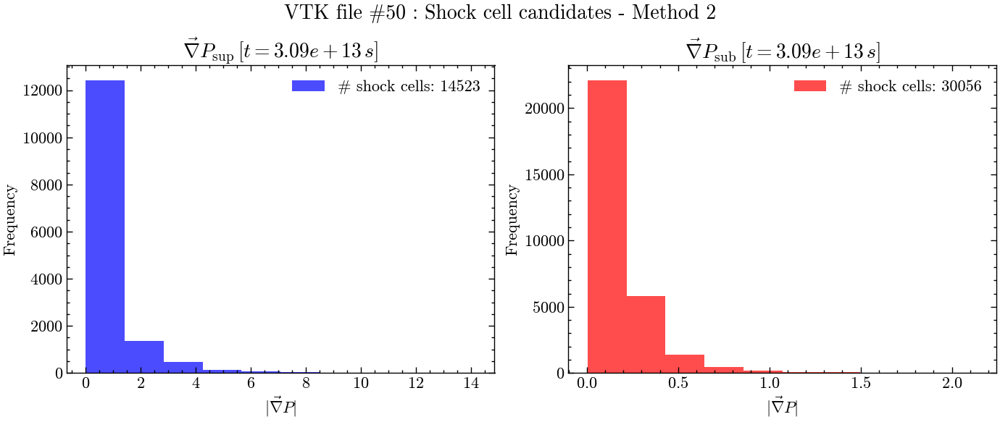

In [37]:
# Call the function for the second method
ShockCellsHistM2(rho_cgs_2D_50_sup, rho_cgs_2D_50_sub, 50)

(j) Analyse your results, in particular:

- Do the shock candidate results of methods 1 and 2 agree? Why?

- Do you find similar distributions of shock candidates in both turbulence models? Which model has more shocks? Why?

Shock candidates do not agree completely between methods 1 and 2. As we can see, for the subsonic case, method 2 finds more shock candidates (double). On the other hand, in the supersonic regime, both methods find similar shock candidates, although method 1 finds more shock candidates. 

In the subsonic regime, Method 2 identifies more shock candidates because pressure gradients are more sensitive to smaller variations in the flow. In contrast, Method 1 finds fewer shock candidates due to the generally weak divergence in subsonic flow. In the supersonic regime, both methods give similar results because shocks are stronger, leading to more noticeable velocity divergences and pressure gradients that both methods can detect.

## 4. (6 points) Numerical integration and custom outputs:

(k) Create a python function that loops over all VTK files in a simulation, and saves maps (in both PNG and VTK-like format) of the shock cell candidates for all times. Add time stamps in physical units to the maps. Please don't attach any output files to your emails. Your codes should produce them when I run them locally.

In [38]:
# Create the directory to export the images
if os.path.isdir("./output_data"):
    print("Directory already exists.")
else: 
    print("Directory has been created.")
    os.mkdir("./output_data")

maps_directory = "./output_data/"

Directory has been created.


In [39]:
# Create a dictionary to store the vtk files
# Create the directory to export the images
if os.path.isdir("./vtk_data"):
    print("Directory already exists.")
else: 
    print("Directory has been created.")
    os.mkdir("./vtk_data")

vtk_directory = "./vtk_data/"

Directory has been created.


In [40]:
# Function 
def ShockCellsMap(filename, n, sim_type = 'subsonic', save = False):
    '''
    This function generates a map of the shock cell candidates for the subsonic and supersonic simulations,
    and saves the map as a vtk file and as a .png file.

    Arguments:
            - filename (str) : the vtk file name
            - n (int)        : the index of the vtk file
            - sim_type (str) : the type of simulation (subsonic or supersonic)
            - save (bool)    : whether to save the map or not
    
    Returns:
            - saves the shock cells into a vtk file
            - shows or saves the shock cells map
    '''

    
    # Get the data from the vtk file
    _, vx1_cgs_2D, vx2_cgs_2D, _, _ = ReadVTKData(filename)

    # We will use the divergence method for the analysis
    # Compute the shock cells candidates
    _, div_neg = IsolateNegativeDiv(vx1_cgs_2D, vx2_cgs_2D, n)

    # Get the binary maps
    binary_div = np.where(~np.isnan(div_neg), 1, 0)


    # Write it into a vtk file
    x = np.linspace(mesh.bounds[0], mesh.bounds[1], (mesh.dimensions[0] - 1))
    y = np.linspace(mesh.bounds[2], mesh.bounds[3], (mesh.dimensions[1] - 1))

    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)

    # Generate the grid
    grid = pv.StructuredGrid(X, Y, Z)

    # Substitue nan values by 0
    new_div_neg = np.nan_to_num(div_neg, nan = 0)

    # Put the data into the grid
    grid.point_data['shock_cells'] = new_div_neg.flatten()

    # Save the grid into a vtk file
    grid.save(vtk_directory + sim_type + "_shock_cells_{:03d}".format(n) + ".vtk")


    # Plot the shock cells candidates
    fig, ax = plt.subplots(1, 1, figsize = (8, 6))
    fig.suptitle(f"VTK file #{n}" + " : Shock cell candidates", fontsize = 20)

    z1 = ax.pcolormesh(X_2D, Y_2D, binary_div, cmap = "Oranges", vmin = 0, vmax = 1)
    ax.set_title(rf"$\nabla\cdot\vec{{v}}_{{\rm {sim_type}}}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax.set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl1 = plt.colorbar(z1)
    cl1.set_label("Shock cells")

    plt.tight_layout()

    if save:
        plt.savefig(maps_directory + sim_type + "_shock_cells_{:03d}.png".format(n))
        plt.close()
    else: 
        plt.show()
        plt.close()

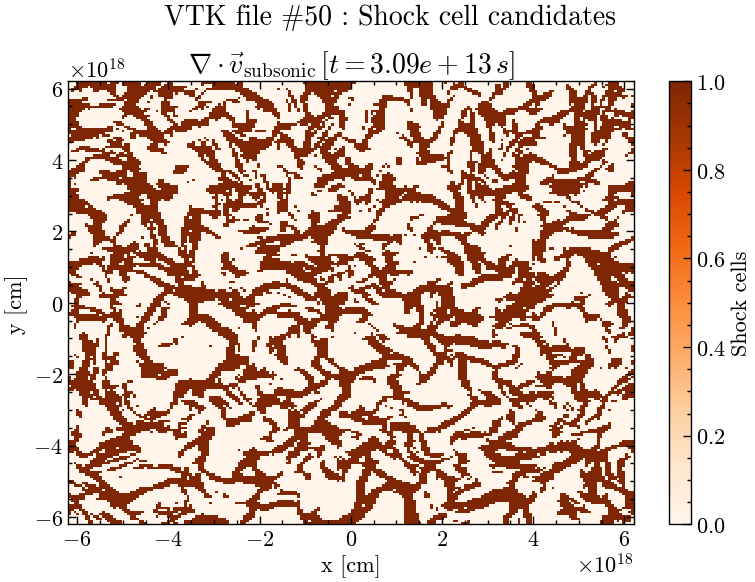

In [41]:
# Test the function
ShockCellsMap(subsonic_data + 'data.0050.vtk', 50, sim_type = 'subsonic', save = False)


In [42]:
# Call the function for the subsonic simulation
for i in range(0, len(time_cgs)):
    file = subsonic_data + "data.0{:03d}.vtk".format(i) 
    ShockCellsMap(file, i, sim_type = 'subsonic', save = True)

In [43]:
# Call the function for the supersonic simulation
for i in range(0, len(time_cgs)):
    file = supersonic_data + "data.0{:03d}.vtk".format(i) 
    ShockCellsMap(file, i, sim_type = 'supersonic', save = True)

(l) Create a python function that loops over all VTK files, and computes the following integrated quantities for each time:

- the total number of shock candidates, $N_{\rm shocks}$ computed from each method 1 and 2,

- the (volume-weighted) average velocity dispersion, $\sigma_v = \sqrt{[ v^2 ] - [v ]^2}$,

- the rms Mach number, ${\cal M}_{\rm rms}$, for which you need $c_{\rm iso}$ given in **units.out**,

and returns:

- a CSV file with 5 columns, time on the first column, and the above quantities in the next ones. There is no need to attach the CSV file to your emails, your code should produce the file locally when I run it.

In [44]:
def IntegratedQuantities(sim_type = "subsonic"):
    '''
    Function to compute the total number of shock cells candidates for the subsonic and supersonic simulations, 
    the weighted average velocity dispersion, and the Mach number. The function saves the data into a .csv file.

    Arguments:
            - sim_type (str) : the type of simulation (subsonic or supersonic)

    Returns:
            - saves the integrated quantities into a .csv file
            - df (pd.DataFrame): the integrated quantities

    '''

    if sim_type == "subsonic":
        data_directory = subsonic_data
    else:
        data_directory = supersonic_data


    # Empty lists to store the integrated quantities
    shock_cells_method1  = []
    shock_cells_method2  = []
    average_velocity     = []
    mach_number          = []

    # define the file name 
    for i in range(0, len(time_cgs)):
        file = data_directory + "data.0{:03d}.vtk".format(i) 

        # Read the vtk file
        rho_cgs_2D, vx1_cgs_2D, vx2_cgs_2D, _, _ = ReadVTKData(file)

        # Compute the shock cells candidates 
        # Method 1
        _, div_neg = IsolateNegativeDiv(vx1_cgs_2D, vx2_cgs_2D, i)

        # Method 2
        _, grad_large = IsolateLargeGrad(rho_cgs_2D, i)

        # Compute the binary maps
        binary_div = np.where(~np.isnan(div_neg), 1, 0)
        binary_grad = np.where(~np.isnan(grad_large), 1, 0)

        # Compute the integrated quantities
        shock_cells_div = np.sum(binary_div) 
        shock_cells_grad = np.sum(binary_grad)

        # Compute the average velocity
        avg_vel     = np.mean(np.sqrt(vx1_cgs_2D**2 + vx2_cgs_2D**2))
        avg_vel_sqr = np.mean(vx1_cgs_2D**2 + vx2_cgs_2D**2)

        avg_weighted_vel = np.sqrt(avg_vel_sqr - avg_vel**2)
        
        # Compute the Mach number
        mach_num = avg_vel / c_iso[0]

        # Append the values to the lists
        shock_cells_method1.append(shock_cells_div)
        shock_cells_method2.append(shock_cells_grad)
        average_velocity.append(avg_weighted_vel)
        mach_number.append(mach_num)

    # Convert the lists to numpy arrays
    shock_cells_method1 = np.array(shock_cells_method1)
    shock_cells_method2 = np.array(shock_cells_method2)
    average_velocity = np.array(average_velocity)
    mach_number = np.array(mach_number)

    # Put the data in a DataFrame
    df = pd.DataFrame({"Time [s]": time_cgs,
                       "Shock cells method 1": shock_cells_method1,
                       "Shock cells method 2": shock_cells_method2,
                       "Average velocity dispersion": average_velocity,
                       "Mach number": mach_number})
    
    df.to_csv(maps_directory + sim_type + "_integrated_quantities.csv", sep = ",", index = False)

    return df 


In [45]:
# Call the function for the subsonic simulation
df_subsonic = IntegratedQuantities(sim_type = "subsonic")
df_supersonic = IntegratedQuantities(sim_type = "supersonic")

(m) Call your function from (l) for each simulation set (supersonic and subsonic) and use the CSV files to make the following plots:

- A 2-panel figure showing the supersonic (left) and subsonic (right) $N_{\rm shocks}$ time.

- A 2-panel figure showing the supersonic (left) and subsonic (right) ${\cal M}_{\rm rms}$ versus time.

Since the function returns the df for the csv file, we can use the df to make the plots.

In [46]:
# Get the subsonic and supersonic shock cells data
n_shock_cells_subsonic = df_subsonic["Shock cells method 1"].values
n_shock_cells_supersonic = df_supersonic["Shock cells method 1"].values

# Get the mach numbers
mach_number_subsonic = df_subsonic["Mach number"].values
mach_number_supersonic = df_supersonic["Mach number"].values

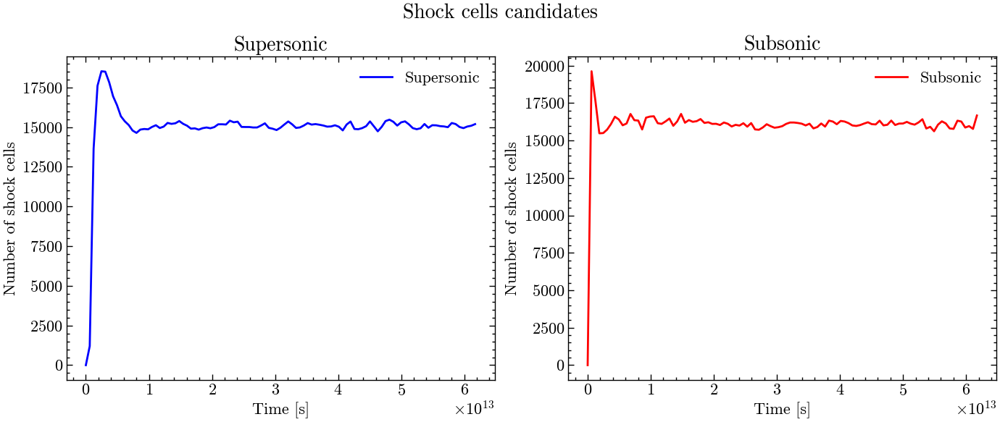

In [47]:
# Make 2-panel plot for the shock cells
fig, ax = plt.subplots(1, 2, figsize = (14, 6))
fig.suptitle("Shock cells candidates", fontsize = 20)

ax[0].plot(time_cgs, n_shock_cells_supersonic, color = "blue", label = "Supersonic")
ax[0].set_title("Supersonic", fontsize = 20)
ax[0].set(xlabel = "Time [s]", ylabel = "Number of shock cells")
ax[0].legend()

ax[1].plot(time_cgs, n_shock_cells_subsonic, color = "red", label = "Subsonic")
ax[1].set_title("Subsonic", fontsize = 20)
ax[1].set(xlabel = "Time [s]", ylabel = "Number of shock cells")
ax[1].legend()

plt.tight_layout()
plt.show()
plt.close()

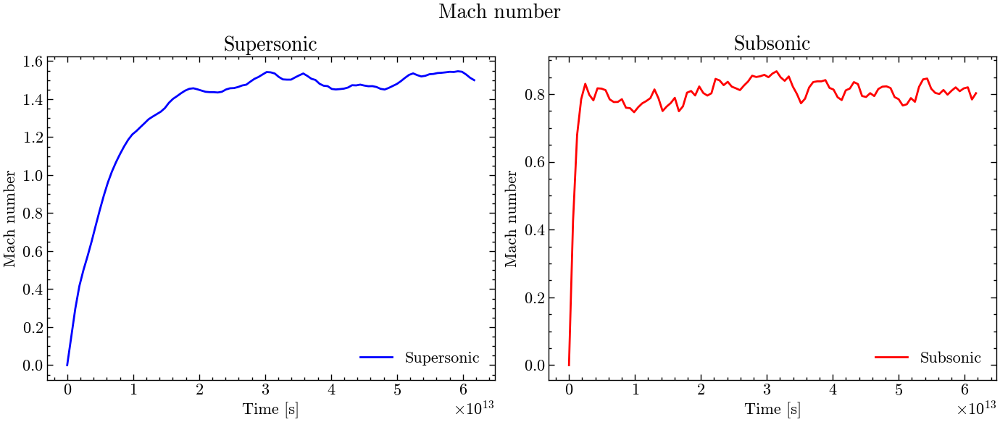

In [48]:
# Now, a 2-panel plot for the Mach number
fig, ax = plt.subplots(1, 2, figsize = (14, 6))
fig.suptitle("Mach number", fontsize = 20)

ax[0].plot(time_cgs, mach_number_supersonic, color = "blue", label = "Supersonic")
ax[0].set_title("Supersonic", fontsize = 20)
ax[0].set(xlabel = "Time [s]", ylabel = "Mach number")
ax[0].legend()

ax[1].plot(time_cgs, mach_number_subsonic, color = "red", label = "Subsonic")
ax[1].set_title("Subsonic", fontsize = 20)
ax[1].set(xlabel = "Time [s]", ylabel = "Mach number")
ax[1].legend()

plt.tight_layout()
plt.show()
plt.close()

(n) Analyse your results, in particular:

- Does the flow reach steady state in both models? At what times?
  
- Is there a relation between $N_{\rm shocks}$ and ${\cal M}_{\rm rms}$?

Yes, the flow reaches a steady state. For the subsonic regime, the system reaches a steady state quite fast, at about $t\approx 0.2E+13$ [s]. On the other hand, the supersonic regime reaches a steady state at about $t\approx 2E+13$ [s].

We can clearly appreciate the relation between $N_{\rm shocks}$ and ${\cal M}_{\rm rms}$. As the number of shocks increases, the rms Mach number also increases. This is because shocks are regions of high velocity gradients, which are associated with high Mach numbers. Moreover, the time evolution of the number of shocks and the rms Mach number is similar in both regimes, with the supersonic regime having more shocks and higher Mach numbers than the subsonic regime. We can also see a peak in the number of shocks in both regimes at early times, which is associated with the initial turbulence generation.

## 5. (1 point) Shock animation:

(o) Create a python function that returns movies for each simulation (supersonic and subsonic) showing the time evolution of:

- maps of the shocks (printed in k), jointly with

- the total number of shock candidates, $N_{\rm shocks}$, computed in (l).

In [49]:
# First, we need to generate the 2-panel plots showing the shock cells maps and the number of shock cells
def shockCellsMapAndNumber(filename, n, sim_type = "subsonic"):

    if sim_type == "subsonic":
        shock_cells = n_shock_cells_subsonic
    else:
        shock_cells = n_shock_cells_supersonic

    # Get the data from the vtk file
    _, vx1_cgs_2D, vx2_cgs_2D, _, _ = ReadVTKData(filename)

    # We will use the divergence method for the analysis
    # Compute the shock cells candidates
    _, div_neg = IsolateNegativeDiv(vx1_cgs_2D, vx2_cgs_2D, n)

    # Get the binary maps
    binary_div = np.where(~np.isnan(div_neg), 1, 0)

    # Plot the shock cells candidates
    fig, ax = plt.subplots(1, 2, figsize = (14, 6))
    fig.suptitle(f"VTK file #{n}" + f" : {sim_type} shock cell candidates", fontsize = 20)

    z1 = ax[0].pcolormesh(X_2D, Y_2D, binary_div, cmap = "Oranges")
    ax[0].set_title(r"$\nabla\cdot\vec{v}\,[t = " + f"{time_cgs[n]:.2e}" + "\\,s" + "]$", fontsize = 20)
    ax[0].set(xlabel = "x [cm]", ylabel = "y [cm]")
    cl1 = plt.colorbar(z1)
    cl1.set_label("Shock cells")

    ax[1].plot(time_cgs[:n + 1], shock_cells[:n+1], color = "red")
    ax[1].set_title("Number of shock cells", fontsize = 20)
    ax[1].set(xlabel = "Time [s]", ylabel = "Number of shock cells")
    ax[1].set_xlim(time_cgs[0], time_cgs[-1])

    if sim_type == "subsonic":
        ax[1].set_ylim(0, 19000)
    else:
        ax[1].set_ylim(0, 20000)

    plt.tight_layout()
    plt.savefig(maps_directory + sim_type + "_map_shock_cells_{:03d}.png".format(n))
    plt.close()

In [50]:
# Test the function 
shockCellsMapAndNumber(supersonic_data + 'data.0100.vtk', 100, sim_type = 'supersonic')

In [51]:
# Call the function for the subsonic simulation
for i in range(0, len(time_cgs)):
    file = subsonic_data + "data.0{:03d}.vtk".format(i) 
    shockCellsMapAndNumber(file, i, sim_type = 'subsonic')

In [52]:
# Call the function for the supersonic simulation
for i in range(0, len(time_cgs)):
    file = supersonic_data + "data.0{:03d}.vtk".format(i) 
    shockCellsMapAndNumber(file, i, sim_type = 'supersonic')

In [53]:
# Define a function to generate the animation using the images
def generateAnimation(sim_type = "subsonic"):
    # Now, let's use the images to create an animation
    images_input = "./output_data/" + sim_type + "_map_shock_cells_*.png"
    imgif_output = "./output_data/" + sim_type + "_shock_cells_animation.gif"

    # Collect the images 
    imgs = (Image.open(f) for f in sorted(glob.glob(images_input)))

    img = next(imgs)

    img.save(fp = imgif_output, format = "GIF", append_images = imgs,\
            save_all = True, duration = 100, loop = 0)
    
    print(f"Animation for the {sim_type} simulation has been created.")

    return 


In [54]:
# Call the function for the subsonic simulation
generateAnimation(sim_type = "subsonic")

Animation for the subsonic simulation has been created.


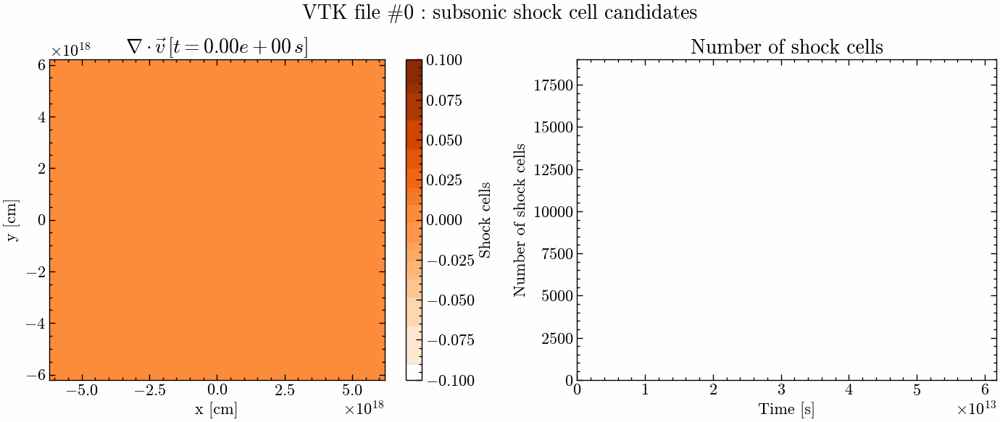

In [55]:
# Display the animation
display.Image(filename = "./output_data/subsonic_shock_cells_animation.gif")

In [56]:
# Call the function for the supersonic simulation
generateAnimation(sim_type = "supersonic")

Animation for the supersonic simulation has been created.


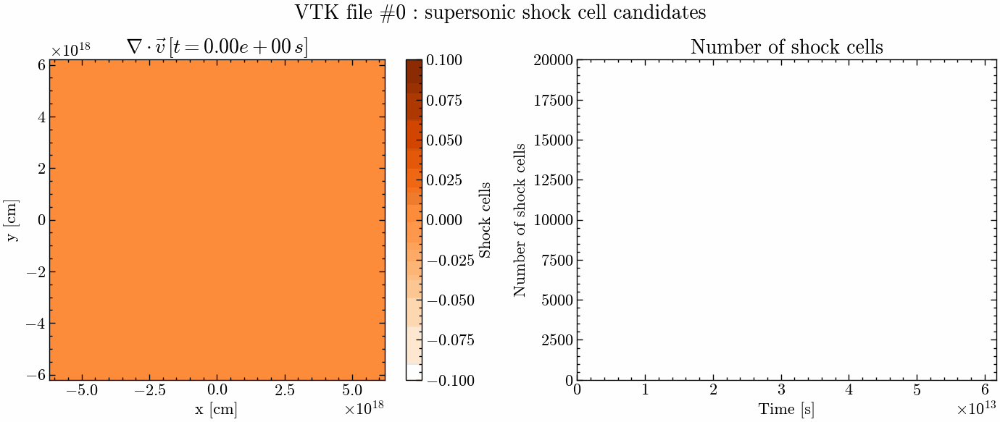

In [57]:
# Display the animation
display.Image(filename = "./output_data/supersonic_shock_cells_animation.gif")